In [2]:
import nibabel as nib
import numpy as np
import plotly.graph_objects as go

# Function to load NIfTI files and extract a slice for visualization
def load_nii_and_extract_slice(image_path, slice_idx=None):
    # Load the NIfTI file
    nii = nib.load(image_path)
    image_data = nii.get_fdata()
    
    # If a slice index is provided, extract that slice
    if slice_idx is not None:
        return image_data[:, :, slice_idx]  # Return 2D slice along z-axis (depth)
    else:
        # If no slice index is provided, return the middle slice
        middle_slice = image_data.shape[2] // 2
        return image_data[:, :, middle_slice]

# Paths to your NIfTI images
img_path_1 = 'patient001_frame01_img.nii.gz'
gt_path_1 = 'patient001_frame01_gt.nii.gz'
pred_path_1 = 'patient001_frame01_pred.nii.gz'

img_path_2 = 'patient001_frame12_img.nii.gz'
gt_path_2 = 'patient001_frame12_gt.nii.gz'
pred_path_2 = 'patient001_frame12_pred.nii.gz'

# Extract slices from the 3D volumes
slice_img_1 = load_nii_and_extract_slice(img_path_1)
slice_gt_1 = load_nii_and_extract_slice(gt_path_1)
slice_pred_1 = load_nii_and_extract_slice(pred_path_1)

slice_img_2 = load_nii_and_extract_slice(img_path_2)
slice_gt_2 = load_nii_and_extract_slice(gt_path_2)
slice_pred_2 = load_nii_and_extract_slice(pred_path_2)

# Function to create a Plotly figure for side-by-side comparison
def create_side_by_side_plot(img, gt, pred, title="Frame Comparison"):
    # Create subplots: 1 row, 3 columns
    fig = go.Figure()

    # Original Image
    fig.add_trace(go.Image(z=img, name="Original Image"))
    
    # Ground Truth Image
    fig.add_trace(go.Image(z=gt, name="Ground Truth", opacity=0.6))
    
    # Predicted Image
    fig.add_trace(go.Image(z=pred, name="Predicted Mask", opacity=0.6))

    fig.update_layout(
        title=title,
        xaxis=dict(showticklabels=False),
        yaxis=dict(showticklabels=False),
        updatemenus=[
            dict(
                type="buttons", 
                x=0.5, y=-0.1,
                showactive=False,
                buttons=[dict(label="Reset", method="relayout", args=[{"xaxis.range": [0, img.shape[1]], "yaxis.range": [0, img.shape[0]]}])]
            )
        ],
        height=600
    )
    
    return fig

# Create a comparison plot for Frame 1
fig_1 = create_side_by_side_plot(slice_img_1, slice_gt_1, slice_pred_1, title="Frame 1 Comparison")

# Create a comparison plot for Frame 2
fig_2 = create_side_by_side_plot(slice_img_2, slice_gt_2, slice_pred_2, title="Frame 12 Comparison")

# Show both plots
fig_1.show()
fig_2.show()


In [5]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go

# Load the .nii.gz images using nibabel
gt_image_path = 'patient001_frame01_gt.nii.gz'
pred_image_path = 'patient001_frame01_pred.nii.gz'

gt_img = nib.load(gt_image_path)
pred_img = nib.load(pred_image_path)

gt_data = gt_img.get_fdata()
pred_data = pred_img.get_fdata()

# Choose a slice to visualize (you can change the slice index as needed)
slice_idx = 50  # You can change this depending on which slice you're interested in

# Normalize the images to be in the range [0, 1] for better visualization
gt_slice = gt_data[:, :, slice_idx]
pred_slice = pred_data[:, :, slice_idx]

gt_slice = (gt_slice - np.min(gt_slice)) / (np.max(gt_slice) - np.min(gt_slice))
pred_slice = (pred_slice - np.min(pred_slice)) / (np.max(pred_slice) - np.min(pred_slice))

# Plot using Matplotlib (for side-by-side comparison)
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Ground truth slice
ax[0].imshow(gt_slice, cmap='gray')
ax[0].set_title("Ground Truth")
ax[0].axis('off')

# Predicted slice
ax[1].imshow(pred_slice, cmap='gray')
ax[1].set_title("Prediction")
ax[1].axis('off')

plt.show()

# Optional: Plot using Plotly for better interactivity
fig_plotly = go.Figure()

# Add ground truth image to Plotly
fig_plotly.add_trace(go.Image(z=gt_slice, name="Ground Truth", colorscale='gray'))

# Add predicted image to Plotly
fig_plotly.add_trace(go.Image(z=pred_slice, name="Prediction", colorscale='gray'))

# Update the layout
fig_plotly.update_layout(
    title="Ground Truth vs. Prediction",
    xaxis=dict(showgrid=False),
    yaxis=dict(showgrid=False),
)

fig_plotly.show()


IndexError: index 50 is out of bounds for axis 2 with size 10

Ground truth shape: (216, 256, 10)
Prediction shape: (216, 256, 10)


/Users/garv/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning:

invalid value encountered in true_divide



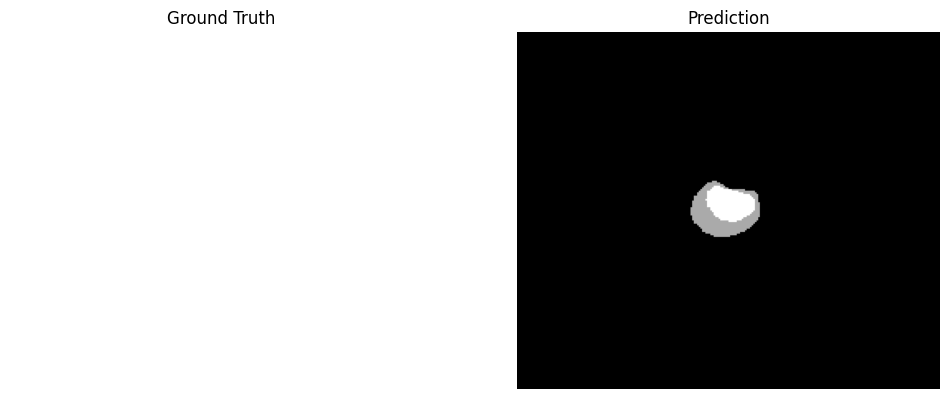

ValueError: Invalid property specified for object of type plotly.graph_objs.Image: 'colorscale'

Did you mean "colormodel"?

    Valid properties:
        colormodel
            Color model used to map the numerical color components
            described in `z` into colors. If `source` is specified,
            this attribute will be set to `rgba256` otherwise it
            defaults to `rgb`.
        customdata
            Assigns extra data each datum. This may be useful when
            listening to hover, click and selection events. Note
            that, "scatter" traces also appends customdata items in
            the markers DOM elements
        customdatasrc
            Sets the source reference on Chart Studio Cloud for
            `customdata`.
        dx
            Set the pixel's horizontal size.
        dy
            Set the pixel's vertical size
        hoverinfo
            Determines which trace information appear on hover. If
            `none` or `skip` are set, no information is displayed
            upon hovering. But, if `none` is set, click and hover
            events are still fired.
        hoverinfosrc
            Sets the source reference on Chart Studio Cloud for
            `hoverinfo`.
        hoverlabel
            :class:`plotly.graph_objects.image.Hoverlabel` instance
            or dict with compatible properties
        hovertemplate
            Template string used for rendering the information that
            appear on hover box. Note that this will override
            `hoverinfo`. Variables are inserted using %{variable},
            for example "y: %{y}" as well as %{xother}, {%_xother},
            {%_xother_}, {%xother_}. When showing info for several
            points, "xother" will be added to those with different
            x positions from the first point. An underscore before
            or after "(x|y)other" will add a space on that side,
            only when this field is shown. Numbers are formatted
            using d3-format's syntax %{variable:d3-format}, for
            example "Price: %{y:$.2f}".
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format
            for details on the formatting syntax. Dates are
            formatted using d3-time-format's syntax
            %{variable|d3-time-format}, for example "Day:
            %{2019-01-01|%A}". https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format for details on the
            date formatting syntax. The variables available in
            `hovertemplate` are the ones emitted as event data
            described at this link
            https://plotly.com/javascript/plotlyjs-events/#event-
            data. Additionally, every attributes that can be
            specified per-point (the ones that are `arrayOk: true`)
            are available. Finally, the template string has access
            to variables `z`, `color` and `colormodel`. Anything
            contained in tag `<extra>` is displayed in the
            secondary box, for example
            "<extra>{fullData.name}</extra>". To hide the secondary
            box completely, use an empty tag `<extra></extra>`.
        hovertemplatesrc
            Sets the source reference on Chart Studio Cloud for
            `hovertemplate`.
        hovertext
            Same as `text`.
        hovertextsrc
            Sets the source reference on Chart Studio Cloud for
            `hovertext`.
        ids
            Assigns id labels to each datum. These ids for object
            constancy of data points during animation. Should be an
            array of strings, not numbers or any other type.
        idssrc
            Sets the source reference on Chart Studio Cloud for
            `ids`.
        legend
            Sets the reference to a legend to show this trace in.
            References to these legends are "legend", "legend2",
            "legend3", etc. Settings for these legends are set in
            the layout, under `layout.legend`, `layout.legend2`,
            etc.
        legendgrouptitle
            :class:`plotly.graph_objects.image.Legendgrouptitle`
            instance or dict with compatible properties
        legendrank
            Sets the legend rank for this trace. Items and groups
            with smaller ranks are presented on top/left side while
            with "reversed" `legend.traceorder` they are on
            bottom/right side. The default legendrank is 1000, so
            that you can use ranks less than 1000 to place certain
            items before all unranked items, and ranks greater than
            1000 to go after all unranked items. When having
            unranked or equal rank items shapes would be displayed
            after traces i.e. according to their order in data and
            layout.
        legendwidth
            Sets the width (in px or fraction) of the legend for
            this trace.
        meta
            Assigns extra meta information associated with this
            trace that can be used in various text attributes.
            Attributes such as trace `name`, graph, axis and
            colorbar `title.text`, annotation `text`
            `rangeselector`, `updatemenues` and `sliders` `label`
            text all support `meta`. To access the trace `meta`
            values in an attribute in the same trace, simply use
            `%{meta[i]}` where `i` is the index or key of the
            `meta` item in question. To access trace `meta` in
            layout attributes, use `%{data[n[.meta[i]}` where `i`
            is the index or key of the `meta` and `n` is the trace
            index.
        metasrc
            Sets the source reference on Chart Studio Cloud for
            `meta`.
        name
            Sets the trace name. The trace name appears as the
            legend item and on hover.
        opacity
            Sets the opacity of the trace.
        source
            Specifies the data URI of the image to be visualized.
            The URI consists of "data:image/[<media
            subtype>][;base64],<data>"
        stream
            :class:`plotly.graph_objects.image.Stream` instance or
            dict with compatible properties
        text
            Sets the text elements associated with each z value.
        textsrc
            Sets the source reference on Chart Studio Cloud for
            `text`.
        uid
            Assign an id to this trace, Use this to provide object
            constancy between traces during animations and
            transitions.
        uirevision
            Controls persistence of some user-driven changes to the
            trace: `constraintrange` in `parcoords` traces, as well
            as some `editable: true` modifications such as `name`
            and `colorbar.title`. Defaults to `layout.uirevision`.
            Note that other user-driven trace attribute changes are
            controlled by `layout` attributes: `trace.visible` is
            controlled by `layout.legend.uirevision`,
            `selectedpoints` is controlled by
            `layout.selectionrevision`, and `colorbar.(x|y)`
            (accessible with `config: {editable: true}`) is
            controlled by `layout.editrevision`. Trace changes are
            tracked by `uid`, which only falls back on trace index
            if no `uid` is provided. So if your app can add/remove
            traces before the end of the `data` array, such that
            the same trace has a different index, you can still
            preserve user-driven changes if you give each trace a
            `uid` that stays with it as it moves.
        visible
            Determines whether or not this trace is visible. If
            "legendonly", the trace is not drawn, but can appear as
            a legend item (provided that the legend itself is
            visible).
        x0
            Set the image's x position. The left edge of the image
            (or the right edge if the x axis is reversed or dx is
            negative) will be found at xmin=x0-dx/2
        xaxis
            Sets a reference between this trace's x coordinates and
            a 2D cartesian x axis. If "x" (the default value), the
            x coordinates refer to `layout.xaxis`. If "x2", the x
            coordinates refer to `layout.xaxis2`, and so on.
        y0
            Set the image's y position. The top edge of the image
            (or the bottom edge if the y axis is NOT reversed or if
            dy is negative) will be found at ymin=y0-dy/2. By
            default when an image trace is included, the y axis
            will be reversed so that the image is right-side-up,
            but you can disable this by setting
            yaxis.autorange=true or by providing an explicit y axis
            range.
        yaxis
            Sets a reference between this trace's y coordinates and
            a 2D cartesian y axis. If "y" (the default value), the
            y coordinates refer to `layout.yaxis`. If "y2", the y
            coordinates refer to `layout.yaxis2`, and so on.
        z
            A 2-dimensional array in which each element is an array
            of 3 or 4 numbers representing a color.
        zmax
            Array defining the higher bound for each color
            component. Note that the default value will depend on
            the colormodel. For the `rgb` colormodel, it is [255,
            255, 255]. For the `rgba` colormodel, it is [255, 255,
            255, 1]. For the `rgba256` colormodel, it is [255, 255,
            255, 255]. For the `hsl` colormodel, it is [360, 100,
            100]. For the `hsla` colormodel, it is [360, 100, 100,
            1].
        zmin
            Array defining the lower bound for each color
            component. Note that the default value will depend on
            the colormodel. For the `rgb` colormodel, it is [0, 0,
            0]. For the `rgba` colormodel, it is [0, 0, 0, 0]. For
            the `rgba256` colormodel, it is [0, 0, 0, 0]. For the
            `hsl` colormodel, it is [0, 0, 0]. For the `hsla`
            colormodel, it is [0, 0, 0, 0].
        zsmooth
            Picks a smoothing algorithm used to smooth `z` data.
            This only applies for image traces that use the
            `source` attribute.
        zsrc
            Sets the source reference on Chart Studio Cloud for
            `z`.
        
Did you mean "colormodel"?

Bad property path:
colorscale
^^^^^^^^^^

In [7]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go

# Load the .nii.gz images using nibabel
gt_image_path = 'patient001_frame01_gt.nii.gz'
pred_image_path = 'patient001_frame01_pred.nii.gz'

gt_img = nib.load(gt_image_path)
pred_img = nib.load(pred_image_path)

gt_data = gt_img.get_fdata()
pred_data = pred_img.get_fdata()

# Print the shape of the image to understand the dimensions
print(f"Ground truth shape: {gt_data.shape}")
print(f"Prediction shape: {pred_data.shape}")

# Choose a valid slice index
# The third axis is usually the slice axis, and we can get the size of it
slice_idx = 0  # You can change this to any index between 0 and (number of slices - 1)

# Normalize the images to be in the range [0, 1] for better visualization
gt_slice = gt_data[:, :, slice_idx]
pred_slice = pred_data[:, :, slice_idx]

gt_slice = (gt_slice - np.min(gt_slice)) / (np.max(gt_slice) - np.min(gt_slice))
pred_slice = (pred_slice - np.min(pred_slice)) / (np.max(pred_slice) - np.min(pred_slice))

# Plot using Matplotlib (for side-by-side comparison)
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Ground truth slice
ax[0].imshow(gt_slice, cmap='gray')
ax[0].set_title("Ground Truth")
ax[0].axis('off')

# Predicted slice
ax[1].imshow(pred_slice, cmap='gray')
ax[1].set_title("Prediction")
ax[1].axis('off')

plt.show()

# Optional: Plot using Plotly for better interactivity
fig_plotly = go.Figure()

# Add ground truth image to Plotly
fig_plotly.add_trace(go.Image(z=gt_slice, name="Ground Truth", colorscale='gray'))

# Add predicted image to Plotly
fig_plotly.add_trace(go.Image(z=pred_slice, name="Prediction", colorscale='gray'))

# Update the layout
fig_plotly.update_layout(
    title="Ground Truth vs. Prediction",
    xaxis=dict(showgrid=False),
    yaxis=dict(showgrid=False),
)

fig_plotly.show()


In [8]:
import plotly.graph_objects as go
import nibabel as nib
import numpy as np

# Load ground truth, predicted, and original images (replace with correct paths)
gt_path = 'patient001_frame01_gt.nii.gz'
pred_path = 'patient001_frame01_pred.nii.gz'
img_path = 'patient001_frame01_img.nii.gz'

# Load the NIfTI files
gt_img = nib.load(gt_path)
pred_img = nib.load(pred_path)
img_img = nib.load(img_path)

# Convert images to numpy arrays
gt_data = gt_img.get_fdata()
pred_data = pred_img.get_fdata()
img_data = img_img.get_fdata()

# Select a slice to display
slice_idx = 0  # You can adjust this to select different slices
gt_slice = gt_data[:, :, slice_idx]
pred_slice = pred_data[:, :, slice_idx]
img_slice = img_data[:, :, slice_idx]

# Create the Plotly figure
fig_plotly = go.Figure()

# Add ground truth image to Plotly (using Heatmap for colormap control)
fig_plotly.add_trace(go.Heatmap(z=gt_slice, name="Ground Truth", colorscale='Gray', colorbar=dict(title="Intensity")))

# Add predicted image to Plotly
fig_plotly.add_trace(go.Heatmap(z=pred_slice, name="Prediction", colorscale='Viridis', colorbar=dict(title="Intensity")))

# Add original image to Plotly
fig_plotly.add_trace(go.Heatmap(z=img_slice, name="Image", colorscale='Jet', colorbar=dict(title="Intensity")))

# Update layout for better visualization
fig_plotly.update_layout(
    title="Segmentation Results",
    xaxis_title="X Axis",
    yaxis_title="Y Axis",
    showlegend=True
)

# Show the figure
fig_plotly.show()


Ground truth shape: (216, 256, 10)
Prediction shape: (216, 256, 10)


In [14]:
import plotly.graph_objects as go
import plotly.subplots as sp
import nibabel as nib
import numpy as np

# Load ground truth, predicted, and original images (replace with correct paths)
gt_path = 'patient001_frame01_gt.nii.gz'
pred_path = 'patient001_frame01_pred.nii.gz'
img_path = 'patient001_frame01_img.nii.gz'

# Load the NIfTI files
gt_img = nib.load(gt_path)
pred_img = nib.load(pred_path)
img_img = nib.load(img_path)

# Convert images to numpy arrays
gt_data = gt_img.get_fdata()
pred_data = pred_img.get_fdata()
img_data = img_img.get_fdata()

# Select a slice to display
slice_idx = 1  # You can adjust this to select different slices
gt_slice = gt_data[:, :, slice_idx]
pred_slice = pred_data[:, :, slice_idx]
img_slice = img_data[:, :, slice_idx]

# Create subplots
fig = sp.make_subplots(
    rows=1, cols=3,
    subplot_titles=("Ground Truth", "Prediction", "Original Image"),
    shared_yaxes=True
)

# Add ground truth image to subplot
fig.add_trace(go.Heatmap(z=gt_slice, colorscale='Gray', colorbar=dict(title="Intensity")), row=1, col=1)

# Add predicted image to subplot
fig.add_trace(go.Heatmap(z=pred_slice, colorscale='Viridis', colorbar=dict(title="Intensity")), row=1, col=2)

# Add original image to subplot
fig.add_trace(go.Heatmap(z=img_slice, colorscale='Jet', colorbar=dict(title="Intensity")), row=1, col=3)

# Update layout for better visualization
fig.update_layout(
    title="Segmentation Results",
    xaxis_title="X Axis",
    yaxis_title="Y Axis",
    showlegend=False,
    height=500,
    width=1000
)

# Show the figure
fig.show()

In [17]:
import plotly.graph_objects as go
import plotly.subplots as sp
import nibabel as nib
import numpy as np

# Load ground truth, predicted, and original images (replace with correct paths)
gt_path = 'patient001_frame12_gt.nii.gz'
pred_path = 'patient001_frame12_pred.nii.gz'
img_path = 'patient001_frame12_img.nii.gz'

# Load the NIfTI files
gt_img = nib.load(gt_path)
pred_img = nib.load(pred_path)
img_img = nib.load(img_path)

# Convert images to numpy arrays
gt_data = gt_img.get_fdata()
pred_data = pred_img.get_fdata()
img_data = img_img.get_fdata()

# Select a slice to display
slice_idx = 5  # You can adjust this to select different slices
gt_slice = gt_data[:, :, slice_idx]
pred_slice = pred_data[:, :, slice_idx]
img_slice = img_data[:, :, slice_idx]

# Create subplots
fig = sp.make_subplots(
    rows=1, cols=3,
    subplot_titles=("Ground Truth", "Prediction", "Original Image"),
    shared_yaxes=True
)

# Add ground truth image to subplot
fig.add_trace(go.Heatmap(z=gt_slice, colorscale='Gray', colorbar=dict(title="Intensity")), row=1, col=1)

# Add predicted image to subplot
fig.add_trace(go.Heatmap(z=pred_slice, colorscale='Viridis', colorbar=dict(title="Intensity")), row=1, col=2)

# Add original image to subplot
fig.add_trace(go.Heatmap(z=img_slice, colorscale='Jet', colorbar=dict(title="Intensity")), row=1, col=3)

# Update layout for better visualization
fig.update_layout(
    title="Segmentation Results",
    xaxis_title="X Axis",
    yaxis_title="Y Axis",
    showlegend=False,
    height=500,
    width=1000
)

# Show the figure
fig.show()